In [1]:
import json
import pandas as pd
from utils import preprocessing, set_index
from matplotlib import pyplot as plt
import numpy as np
from tensorflow.keras import models
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Layer
from tensorflow.keras import backend as K
from dc_vae_gen_2 import DCVAE, Sampling
from utils import samples_conditions_embedd
import pickle
from statsmodels.graphics.tsaplots import plot_acf

2023-06-07 16:05:29.654208: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1


In [2]:
settings_path = 'settings/model_settings_dc-vae_gen.txt'
settings = json.load(open(settings_path, 'r'))
#path = '../../Datasets/TELCO/'
path = "/home/gastong/Documentos/TELCO/v1/" #Rosaluna
filenames_test = ["TELCO_data_2022_01.zip", "TELCO_data_2022_02.zip", "TELCO_data_2022_03.zip", "TELCO_data_2022_04.zip"]
files_test = [path+ i for i in filenames_test]
print(settings)

{'dataset_name': 'TELCO', 'model_name': 'dc-vae_gen_qt98', 'scale': False, 'wo_outliers': True, 'max_std': 7, 'T': 128, 'M': 12, 'cnn_units': [128, 128, 128, 64, 64, 32, 32], 'dil_rate': [1, 2, 4, 8, 16, 32, 64], 'kernel': 2, 'strs': 1, 'activation': 'selu', 'alpha_reg': 0.0001, 'batch_size': 32, 'J': 32, 'epochs': 200, 'lr': 0.0001, 'lr_decay': True, 'decay_rate': 0.96, 'decay_step': 10000, 'val_percent': 0.2, 'seed': 123, 'summary': True, 'custom_metrics': True}


In [3]:
# Load data and predictions
# Read CSV files from List
data = pd.concat(map(pd.read_csv, files_test))
data = set_index(data)
data = preprocessing(data, flag_scaler=False, outliers=True)
data

,TS1,TS2,TS3,TS4,TS5,TS6,TS7,TS8,TS9,TS10,TS11,TS12
time,,,,,,,,,,,,
2022-01-01 00:00:00,0.648864,0.505284,0.669942,0.837027,0.623184,0.535870,0.634853,0.668639,0.247535,0.875,0.021380,0.021448
2022-01-01 00:05:00,0.649752,0.497994,0.669942,0.820139,0.580578,0.441524,0.590735,0.582840,0.247535,0.875,0.021380,0.021448
2022-01-01 00:10:00,0.593288,0.476937,0.704539,0.777010,0.643936,0.459797,0.548041,0.520710,0.247535,0.875,0.021380,0.021448
2022-01-01 00:15:00,0.544374,0.467724,0.704539,0.835551,0.570099,0.418404,0.556218,0.523669,0.151931,0.575,0.014328,0.016086
2022-01-01 00:20:00,0.611489,0.443933,0.516019,0.795907,0.523654,0.401623,0.632546,0.588757,0.151931,0.575,0.014328,0.016086
...,...,...,...,...,...,...,...,...,...,...,...,...
2022-04-30 23:35:00,0.463985,0.376305,0.542873,0.962454,0.625756,0.509394,0.592097,0.547337,0.608696,1.075,0.080798,0.077748
2022-04-30 23:40:00,0.410685,0.392908,0.699658,1.220401,0.572852,0.456813,0.515510,0.500000,0.608696,1.075,0.080798,0.077748
2022-04-30 23:45:00,0.391252,0.348869,0.699658,1.099329,0.420771,0.442270,0.580746,0.532544,0.234953,0.725,0.103597,0.096515


**Series utilizadas para las prueba**

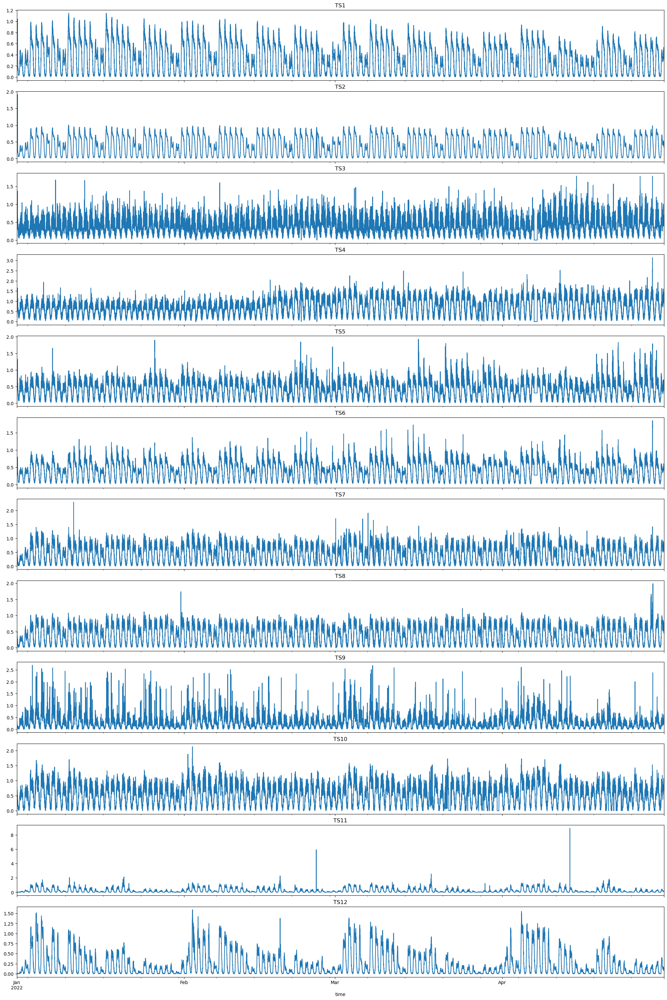

In [4]:
#define number of rows and columns for subplots
nrow=12
ncol=1

columns_list = data.columns

time_start = '2022-01-01'
time_end = '2022-04-30'
fig, axes = plt.subplots(nrow, ncol, figsize=(20,30), constrained_layout=True, sharex=True)

# plot counter
count=0

for r in range(nrow):
    for c in range(ncol):
        data[columns_list[count]][time_start:time_end].plot(ax=axes[r])
        axes[r].set_title(columns_list[count])
        count+=1

## Predicciones

In [5]:
    # Model initialization
model = DCVAE(
    settings['T'],
    settings['M'],
    settings['cnn_units'],
    settings['dil_rate'],
    settings['kernel'],
    settings['strs'],
    settings['batch_size'],
    settings['J'],
    settings['epochs'],
    settings['lr'],
    settings['lr_decay'],
    settings['decay_rate'],
    settings['decay_step'],
    settings['model_name'],
    settings['summary']
    ) 

2023-06-07 16:05:36.951151: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2023-06-07 16:05:36.951814: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2023-06-07 16:05:36.961188: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-06-07 16:05:36.961365: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: NVIDIA TITAN Xp computeCapability: 6.1
coreClock: 1.582GHz coreCount: 30 deviceMemorySize: 11.91GiB deviceMemoryBandwidth: 510.07GiB/s
2023-06-07 16:05:36.961390: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1
2023-06-07 16:05:36.962660: I tensorflow/stream_executor/platform/default/d

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Model: "encoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_samples (InputLayer)      [(None, 128, 12)]    0                                            
______________________________________________________________________________________

In [47]:
anom, error, reconst, sig, latent_space = model.predict(data,
                                        True,
                                        large_result=True,
                                        load_alpha=False,
                                        alpha_set_up = list(np.ones(12)),
                                        alpha_set_down = list(np.ones(12))
                                                    )

In [48]:
th_up = reconst + sig
th_down = reconst - sig
th_up_2 = reconst + 2*sig
th_down_2 = reconst - 2*sig
th_up_3 = reconst + 3*sig
th_down_3 = reconst - 3*sig

**Series reales con las predicciones de media y sigma**

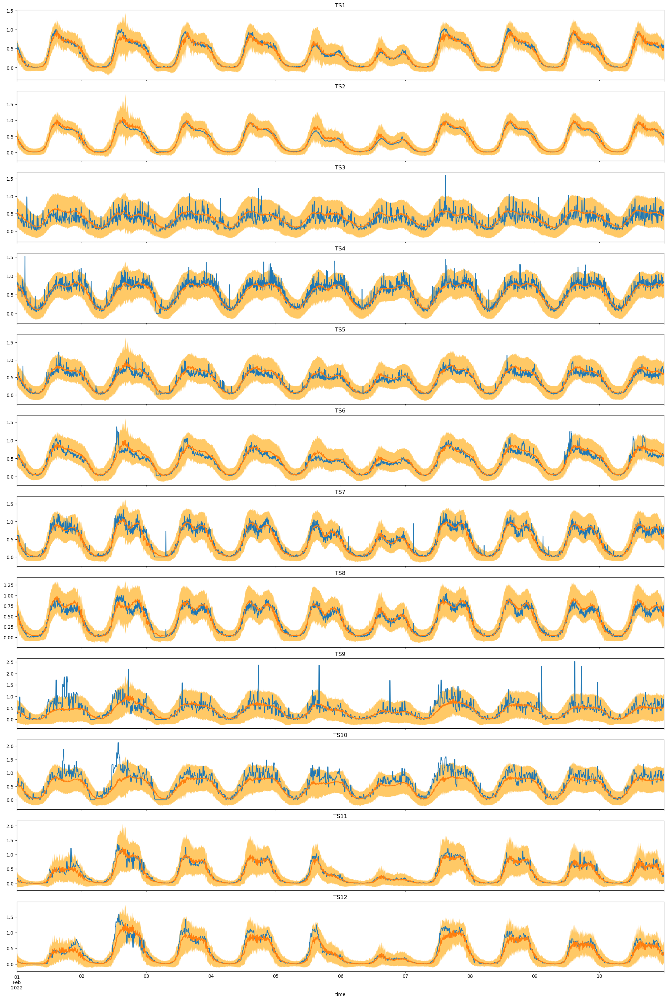

In [49]:
#define number of rows and columns for subplots
nrow=12
ncol=1
data_aux = data[reconst.index[0]:].copy()

columns_list = data_aux.columns

time_start = '2022-02-01'
time_end = '2022-02-10'
fig, axes = plt.subplots(nrow, ncol, figsize=(20,30), constrained_layout=True, sharex=True)

# plot counter
count=0

for r in range(nrow):
    for c in range(ncol):
        data_aux[columns_list[count]][time_start:time_end].plot(ax=axes[r])
        reconst[columns_list[count]][time_start:time_end].plot(ax=axes[r])
        axes[r].fill_between(data_aux[columns_list[count]][time_start:time_end].index,
                         th_up[columns_list[count]][time_start:time_end],
                         th_down[columns_list[count]][time_start:time_end],
                         facecolor='orange', alpha=0.6, interpolate=True)
        axes[r].set_title(columns_list[count])
        count+=1

**Series reales con la predicción de media y diferentes sigmas: sigma, 2 sigma, y 3 sigma**

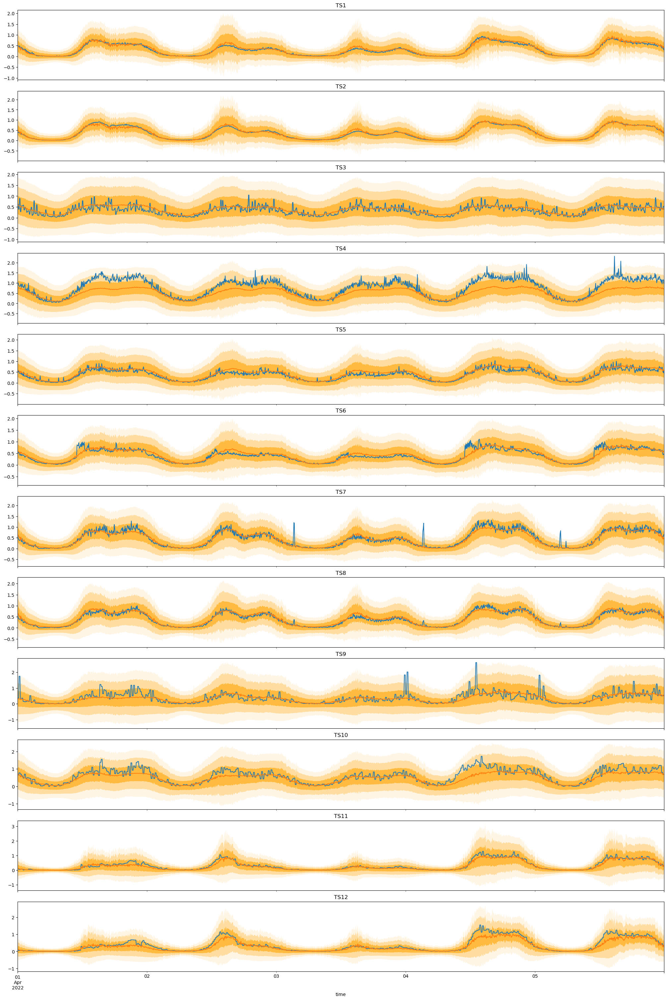

In [9]:
#define number of rows and columns for subplots
nrow=12
ncol=1
data_aux = data[reconst.index[0]:].copy()

columns_list = data_aux.columns

time_start = '2022-04-01'
time_end = '2022-04-05'
fig, axes = plt.subplots(nrow, ncol, figsize=(20,30), constrained_layout=True, sharex=True)

# plot counter
count=0

for r in range(nrow):
    for c in range(ncol):
        data_aux[columns_list[count]][time_start:time_end].plot(ax=axes[r])
        reconst[columns_list[count]][time_start:time_end].plot(ax=axes[r])
        axes[r].fill_between(data_aux[columns_list[count]][time_start:time_end].index,
                         th_up[columns_list[count]][time_start:time_end],
                         th_down[columns_list[count]][time_start:time_end],
                         facecolor='orange', alpha=0.6, interpolate=True)
        axes[r].fill_between(data_aux[columns_list[count]][time_start:time_end].index,
                         th_up_2[columns_list[count]][time_start:time_end],
                         th_down_2[columns_list[count]][time_start:time_end],
                         facecolor='orange', alpha=0.3, interpolate=True)
        axes[r].fill_between(data_aux[columns_list[count]][time_start:time_end].index,
                         th_up_3[columns_list[count]][time_start:time_end],
                         th_down_3[columns_list[count]][time_start:time_end],
                         facecolor='orange', alpha=0.1, interpolate=True)
        axes[r].set_title(columns_list[count])
        count+=1

## Generación de datos

Como se ve más arriba el modelo no presenta grandes dificultades para reconstruir cualquiera de las series. Esto en parte vimos que tiene que ver con cómo estamos normalizando.  Vimos que las transformaciones no lineales: Quantil Transformer, ya sea uniforme o normal, funcionan bien para la reconstrucción de la media, pero da problema para construir a partir de esta y el sigma los intervalos de confianza ya que son funciones no lineales. Probamos algo que no habíamos hecho hasta ahora y es llevar la mayoría de los valores a estar entre [-1, 1] dividiendo por el cuantil del 98%, esto mostro funcionar bastante bien con este cometido sin que los outliers influenciaran en la normalización. 

Por otro lado, con la generación de muestras a partir de ruido vemos que este modelo no nos está funcionando del todo bien. La principal sospecha es que en el espacio de latencia parte de la codificación de la información está en la correlación temporal entre los valores de las variables, ya que correlación entre valores de las variables para un mismo instante vemos que no hay con las nuebes de puntos en colores. Lo primero que nos llevó a esta sospecha es que el decoder con valores del espacio de latencia generados por el encoder, genera muestras razonables como era de esperar, pero sin embargo con muestras generadas a partir de ruido blanco no. Entonces comparamos la autocorrelación para cada variable del espacio de latencia, con la autocorrelación de las variables generadas a partir de ruido y vimos que hay diferencias. En el caso de la primera, si bien no se ven fuertes correlaciones entre muestras, si se logra ver un cierto patrón. En el segundo caso por ser ruido generado de manera aleatoria se puede ver que no hay gran correlación aleatoria y que el patrón es más bien aleatorio.

In [10]:
X, time_info = samples_conditions_embedd(data, settings['T'])
z_mu, z_log_var, z = model.encoder.predict((X, time_info))

In [11]:
z_t = z[:,-1,:]

**Plote del último instante de cada muestra del espacio de latencia z, mostrando la convinacio 1 a 1 de cada variable: z[:, -1, :]. Los colores están relacionados con el timestamp.**

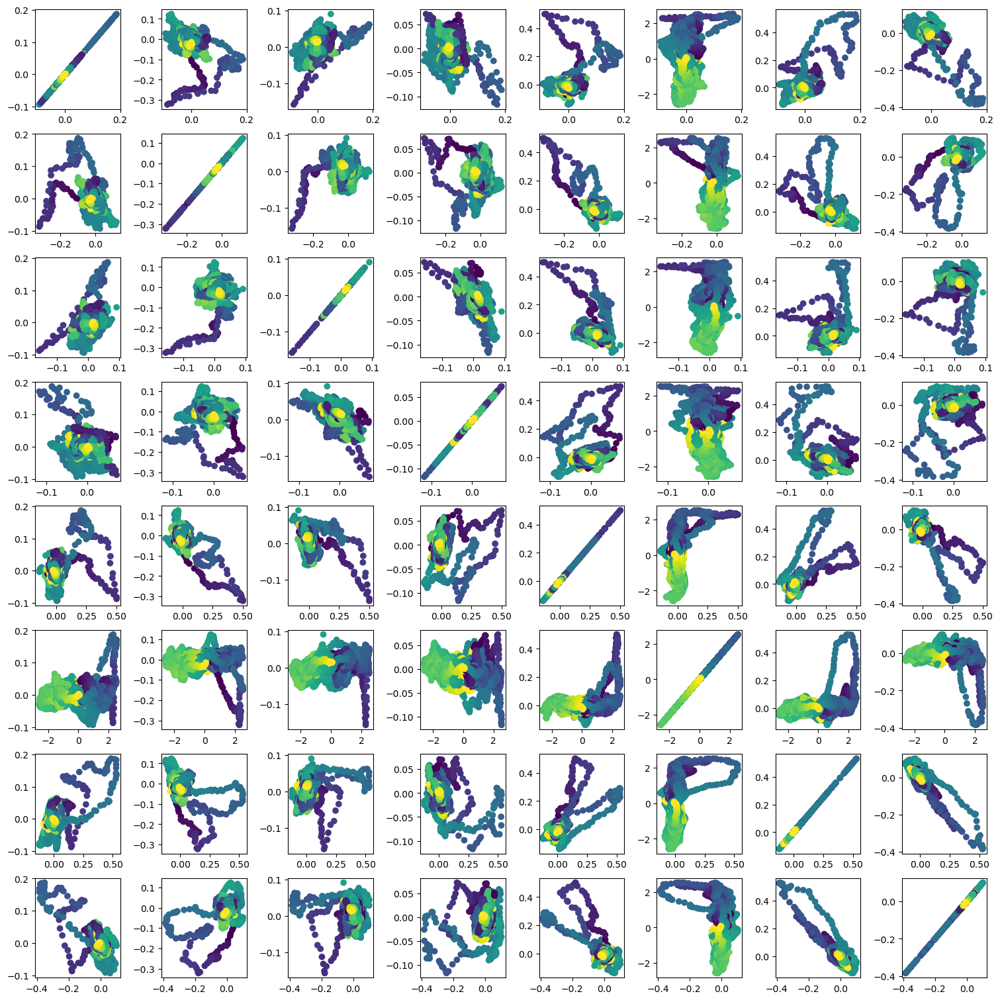

In [12]:
fig, axes = plt.subplots(settings['J']//4, settings['J']//4, figsize=(15,15), constrained_layout=True)

for i in range(settings['J']//4):
    for j in range(settings['J']//4):
        axes[i,j].scatter(z_mu[:, -1, i], z_mu[:, -1, j], c=data.index.hour[settings['T']-1:])

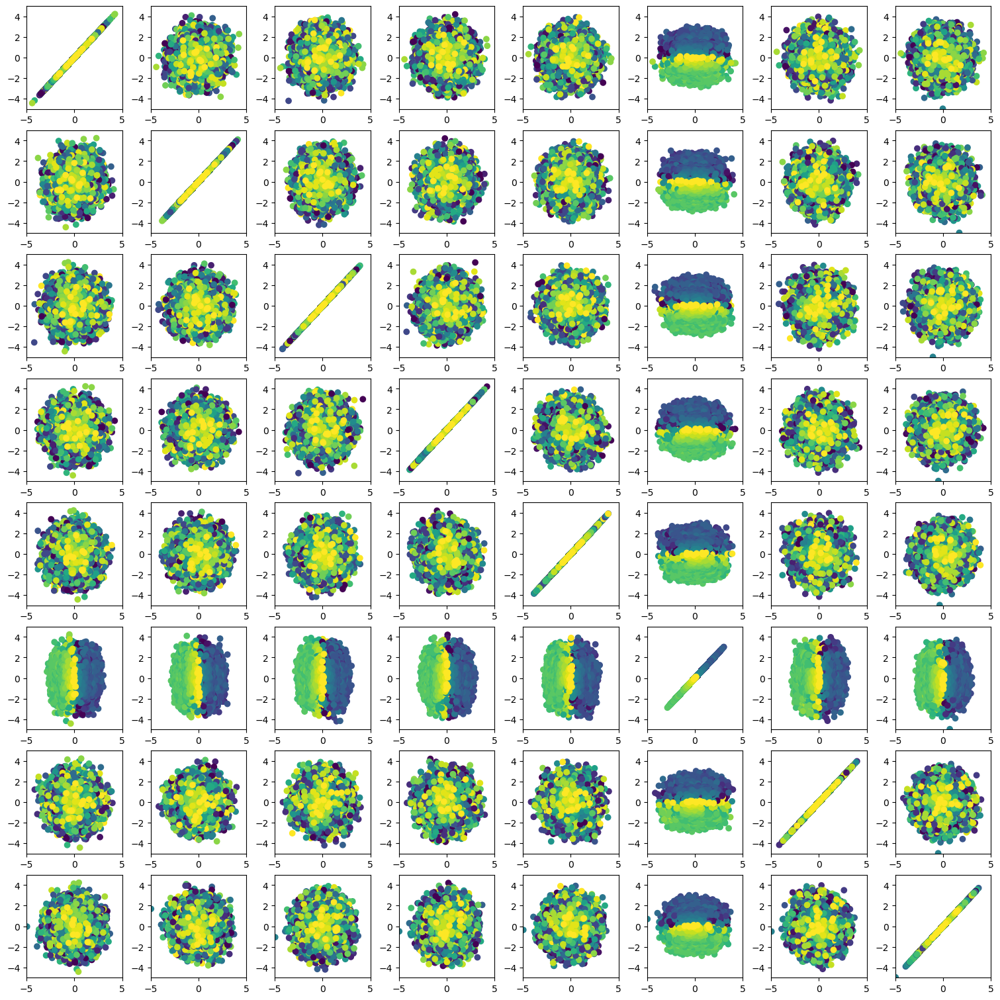

In [14]:
fig, axes = plt.subplots(settings['J']//4, settings['J']//4, figsize=(15,15), constrained_layout=True)

for i in range(settings['J']//4):
    for j in range(settings['J']//4):
        axes[i,j].scatter(z_t[:, i], z_t[:, j], c=data.index.hour[settings['T']-1:])
        axes[i,j].set_xlim(-5,5)
        axes[i,j].set_ylim(-5,5)

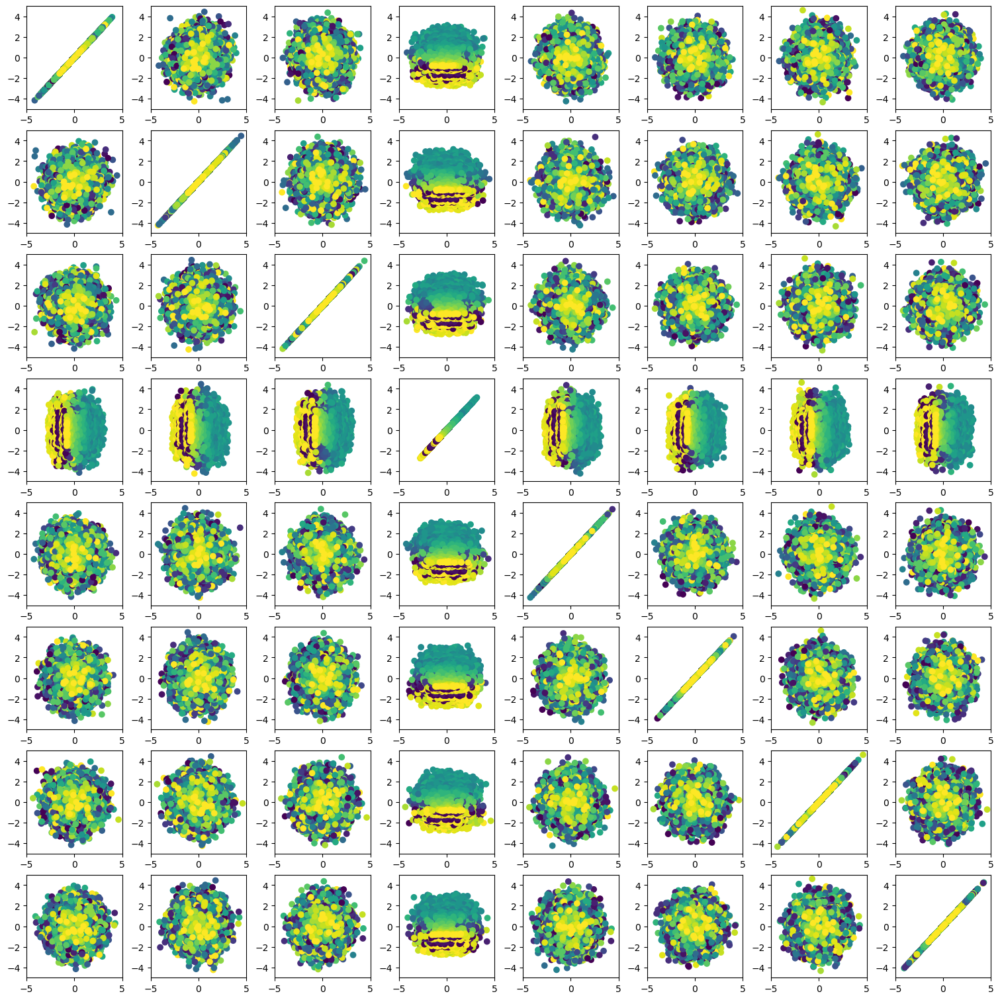

In [15]:
fig, axes = plt.subplots(settings['J']//4, settings['J']//4, figsize=(15,15), constrained_layout=True)

for i in range(settings['J']//4, settings['J']//2):
    for j in range(settings['J']//4, settings['J']//2):
        axes[i-8,j-8].scatter(z_t[:, i], z_t[:, j], c=data.index.hour[settings['T']-1:])
        axes[i-8,j-8].set_xlim(-5,5)
        axes[i-8,j-8].set_ylim(-5,5)

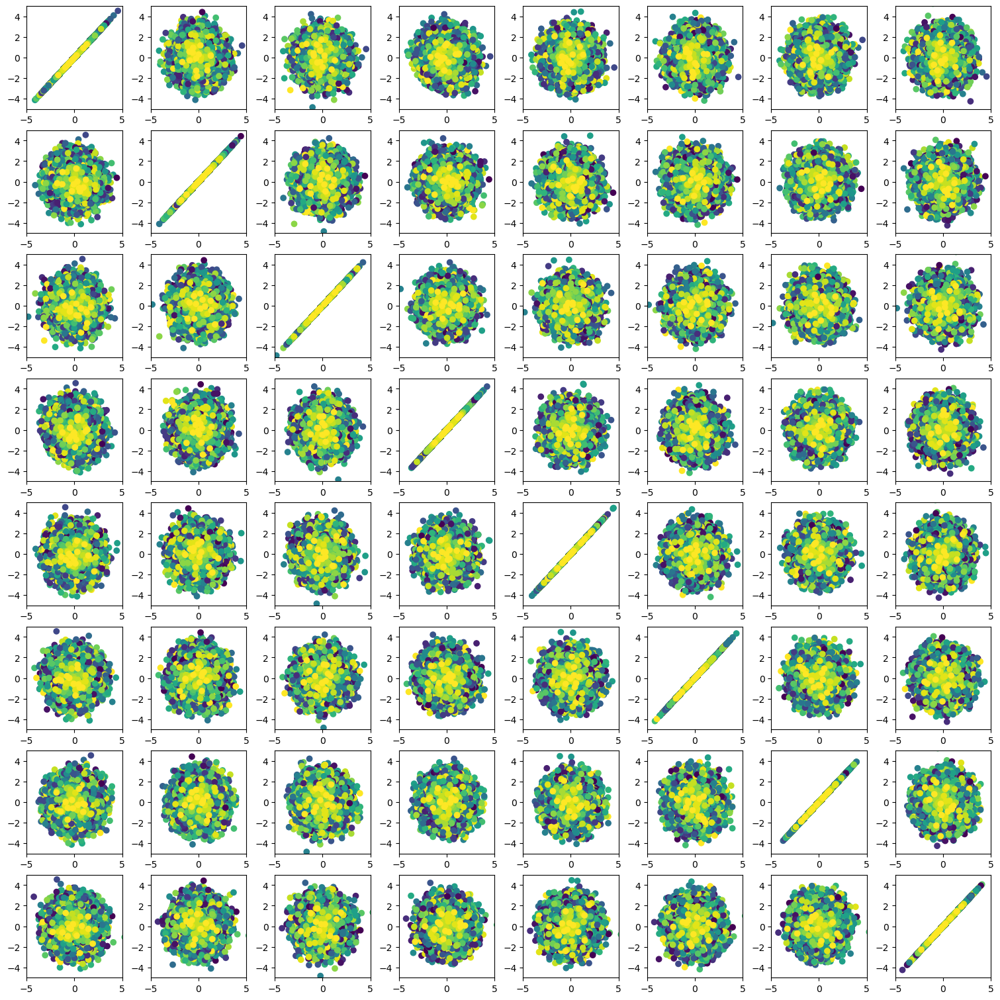

In [16]:
fig, axes = plt.subplots(settings['J']//4, settings['J']//4, figsize=(15,15), constrained_layout=True)

for i in range(settings['J']//2, 3*settings['J']//4):
    for j in range(settings['J']//2, 3*settings['J']//4):
        axes[i-16,j-16].scatter(z_t[:, i], z_t[:, j], c=data.index.hour[settings['T']-1:])
        axes[i-16,j-16].set_xlim(-5,5)
        axes[i-16,j-16].set_ylim(-5,5)

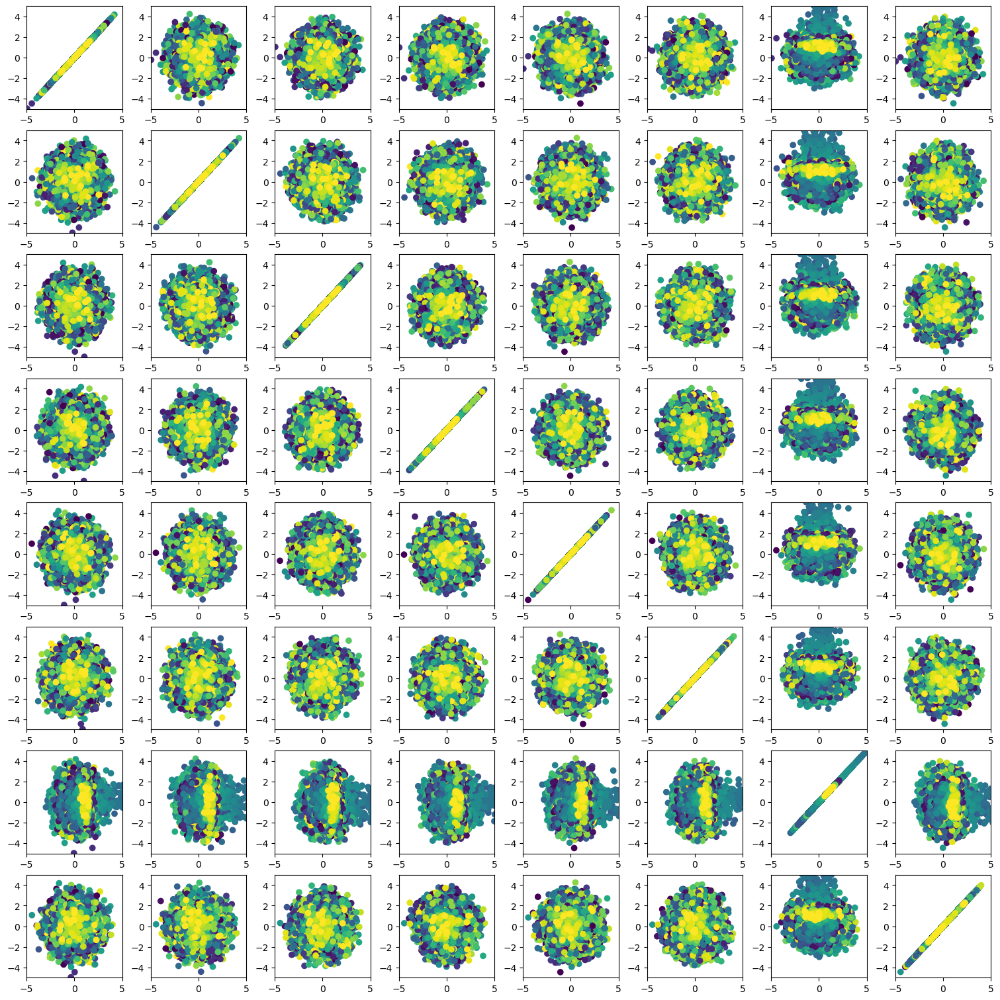

In [17]:
fig, axes = plt.subplots(settings['J']//4, settings['J']//4, figsize=(15,15), constrained_layout=True)

for i in range(3*settings['J']//4, settings['J']):
    for j in range(3*settings['J']//4, settings['J']):
        axes[i-32,j-32].scatter(z_t[:, i], z_t[:, j], c=data.index.hour[settings['T']-1:])
        axes[i-32,j-32].set_xlim(-5,5)
        axes[i-32,j-32].set_ylim(-5,5)

In [18]:
noise = np.random.normal(0, 1, (X.shape[0], 1, settings['J']))
print(noise.shape)

(34433, 1, 32)


**Plote de ruido gaussiano con las mismas dimensiones que z.**

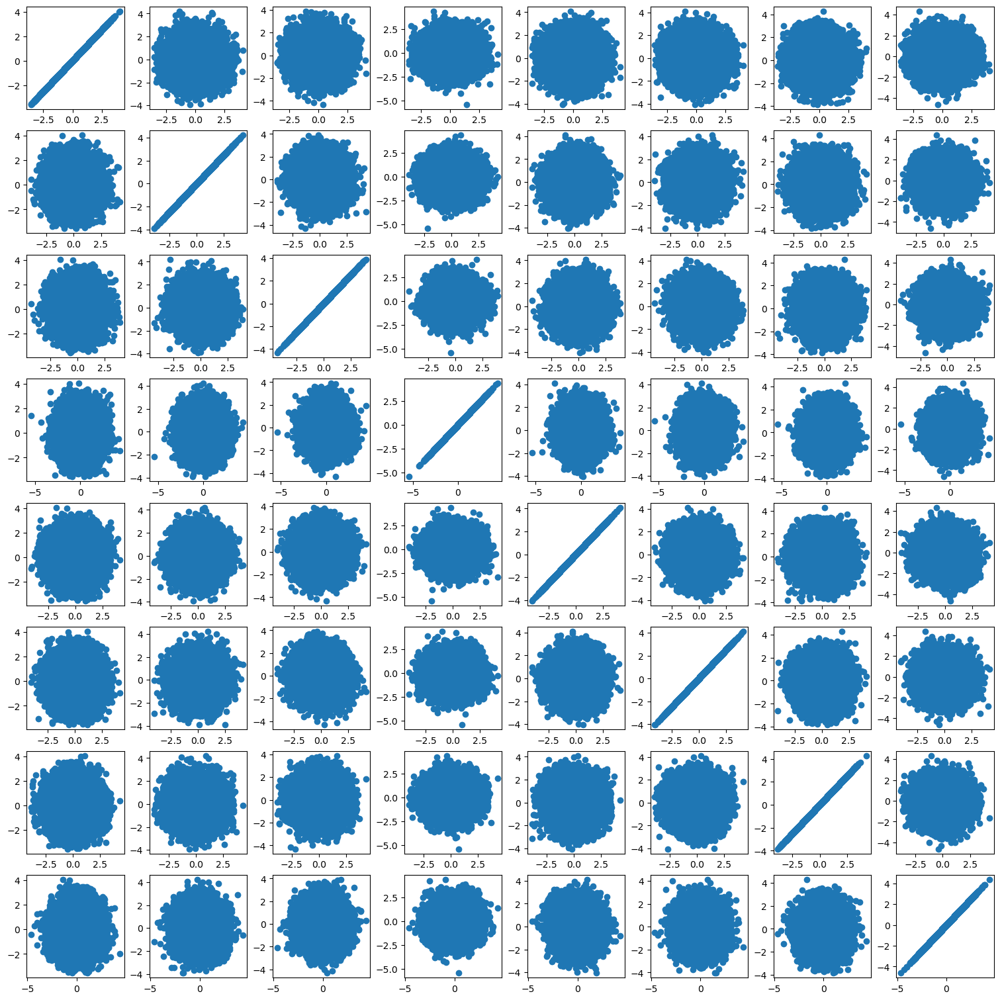

In [19]:
fig, axes = plt.subplots(settings['J']//4, settings['J']//4, figsize=(15,15), constrained_layout=True)

for i in range(settings['J']//4):
    for j in range(settings['J']//4):
        axes[i,j].scatter(noise[:, -1, i], noise[:, -1, j])

In [50]:
decoder = keras.models.load_model(settings['model_name']+'_decoder.h5',
                                                custom_objects={'sampling': Sampling},
                                                compile = True)

In [51]:
settings['model_name']+'_decoder.h5'

'dc-vae_gen_qt98_decoder.h5'

In [52]:
mu_gen, log_var_gen = decoder.predict(z)

In [55]:
sig_gen = np.sqrt(np.exp(log_var_gen))

In [56]:
th_up_gen = mu_gen + sig_gen
th_down_gen = mu_gen - sig_gen

In [57]:
noise2gen = np.random.normal(0, 1, (X.shape[0], settings['T'], settings['M']))

X_gen = mu_gen + noise2gen*(th_up_gen-mu_gen)

**Muestra generada a partir de un z salida del encoder.**

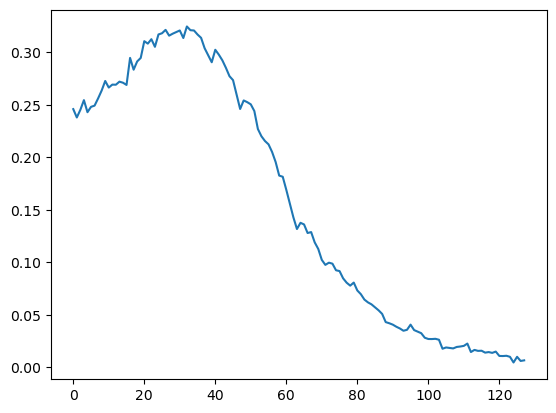

In [58]:
plt.plot(mu_gen[0,:,0])

**Media y varianza de X generadas a partir de muesras z salidas del encoder.**

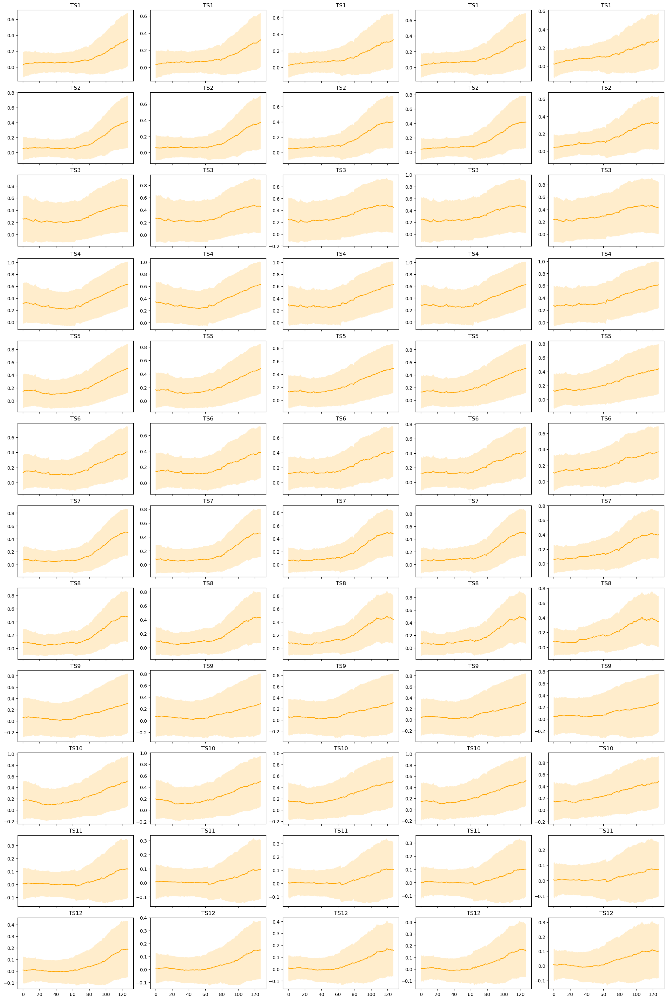

In [59]:
#define number of rows and columns for subplots
nrow=12
ncol=5

offset = 64

columns_list = data_aux.columns

fig, axes = plt.subplots(nrow, ncol, figsize=(20,30), constrained_layout=True, sharex=True)

# plot counter
count=0

for r in range(nrow):
    for c in range(ncol):
        #axes[r, c].plot(X_gen[c+offset,:,r], c='green')
        axes[r, c].plot(mu_gen[c+offset,:,r], c='orange')
        axes[r, c].fill_between(np.arange(settings['T']),
                         th_up_gen[c+offset,:,r],
                         th_down_gen[c+offset,:,r],
                         facecolor='orange', alpha=0.2, interpolate=True)
        axes[r, c].set_title(columns_list[r])
        count+=1

In [64]:
mu_gen, log_var_gen = decoder.predict(noise)

In [65]:
sig_gen = np.sqrt(np.exp(log_var_gen))

In [66]:
th_up_gen = mu_gen + sig_gen
th_down_gen = mu_gen - sig_gen

**Media y varianza de X generadas a partir de ruido.**

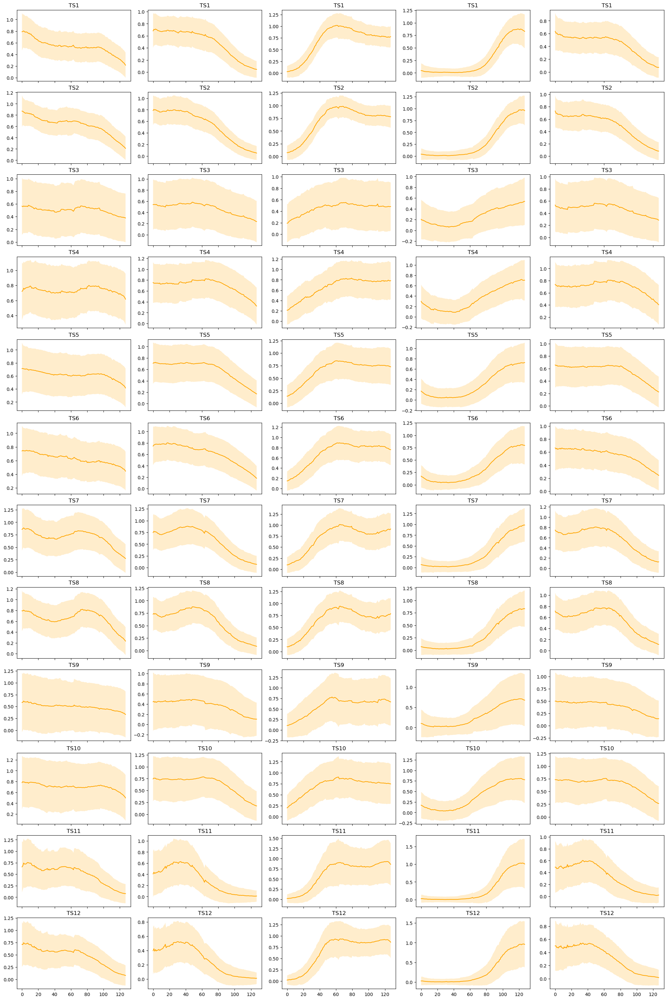

In [67]:
#define number of rows and columns for subplots
nrow=12
ncol=5

offset = 64

columns_list = data_aux.columns

fig, axes = plt.subplots(nrow, ncol, figsize=(20,30), constrained_layout=True, sharex=True)

# plot counter
count=0

for r in range(nrow):
    for c in range(ncol):
        #axes[r, c].plot(X_gen[c+offset,:,r], c='green')
        axes[r, c].plot(mu_gen[c+offset,:,r], c='orange')
        axes[r, c].fill_between(np.arange(settings['T']),
                         th_up_gen[c+offset,:,r],
                         th_down_gen[c+offset,:,r],
                         facecolor='orange', alpha=0.2, interpolate=True)
        axes[r, c].set_title(columns_list[r])
        count+=1

In [68]:
def likelihood(x, mu, sigma):
    return np.exp(-0.5*((x-mu)/sigma)**2)/(np.sqrt(2*np.pi)*sigma)

In [69]:
likelihood_test = likelihood(data[settings['T']-1:], reconst, sig)

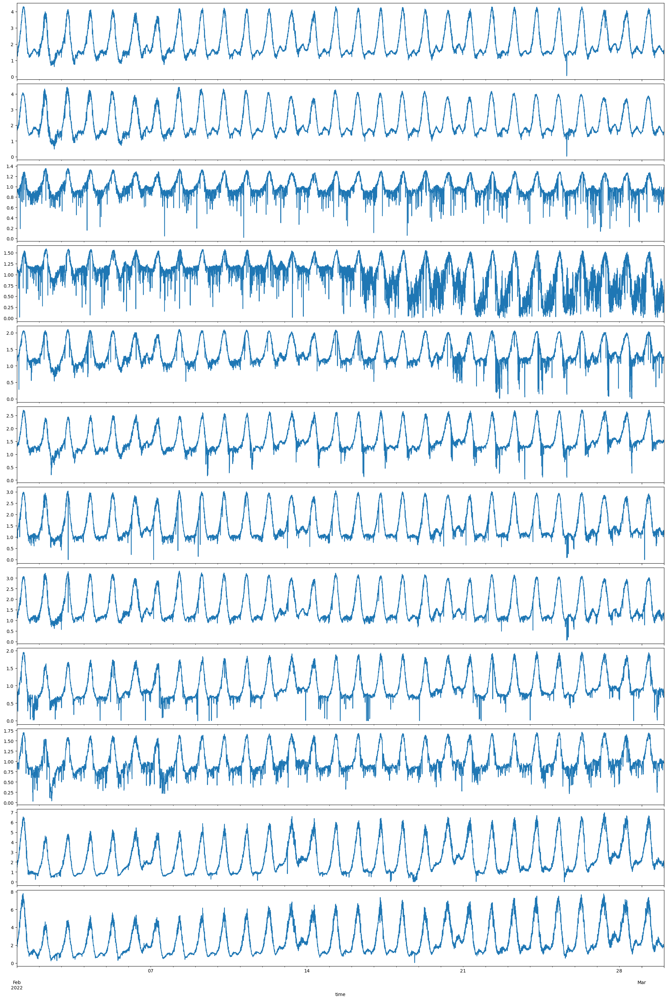

In [70]:
#define number of rows and columns for subplots
nrow=12
ncol=1

columns_list = likelihood_test.columns

time_start = '2022-02-01'
time_end = '2022-03-01'
fig, axes = plt.subplots(nrow, ncol, figsize=(20,30), constrained_layout=True, sharex=True)

# plot counter
count=0

for r in range(nrow):
    for c in range(ncol):
        likelihood_test[columns_list[count]][time_start:time_end].plot(ax=axes[r])
        count+=1

<AxesSubplot:>

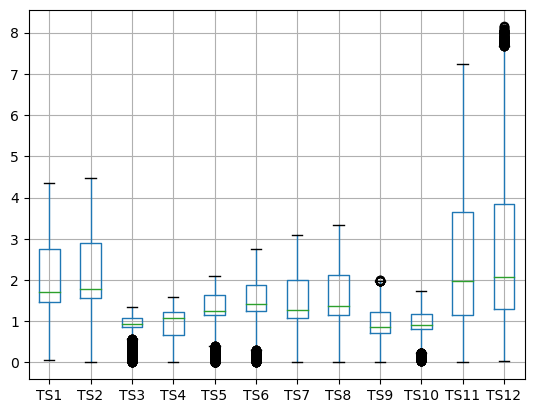

In [77]:
likelihood_test[:'2022-02-10'].boxplot()


<AxesSubplot:>

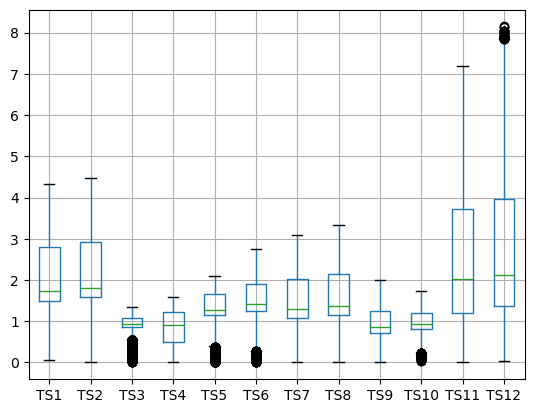

In [81]:
likelihood_test['2022-02-10':].boxplot()

{'whiskers': [<matplotlib.lines.Line2D at 0x7fe970fc2460>,
 'caps': [<matplotlib.lines.Line2D at 0x7fe970fc2a00>,
 'boxes': [<matplotlib.lines.Line2D at 0x7fe970fc2190>,
 'medians': [<matplotlib.lines.Line2D at 0x7fe970fc2fa0>,
 'fliers': [<matplotlib.lines.Line2D at 0x7fe970fb22b0>,
 'means': []}

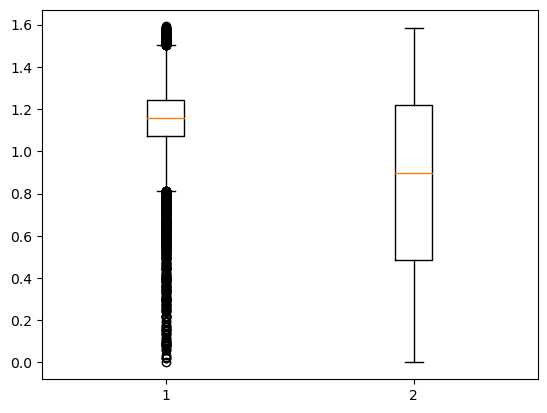

In [85]:
plt.boxplot([likelihood_test[:'2022-02-10']['TS4'].values, likelihood_test['2022-02-10':]['TS4'].values])

In [86]:
model.__save_best_model = False
model.__save_complete_model = False

In [87]:
model.fit(data, settings['val_percent'], settings['seed'])

Epoch 1/200
861/861 [==============================] - 67s 53ms/step - loss: -2.1719 - reconst: -2.1775 - kl: 0.0056 - val_loss: -2.2072 - val_reconst: -2.2073 - val_kl: 1.3190e-04

Epoch 00001: val_loss improved from inf to -2.20721, saving model to dc-vae_gen_qt98_best_model.h5


OSError: Unable to create link (name already exists)

In [88]:
model.__save_best_model

False